In [121]:
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import rdFMCS
from rdkit import DataStructs 
from rdkit.Chem.Fingerprints import FingerprintMols

In [122]:
smiles = Chem.SmilesMolSupplier('AMCase_smiles.smi')

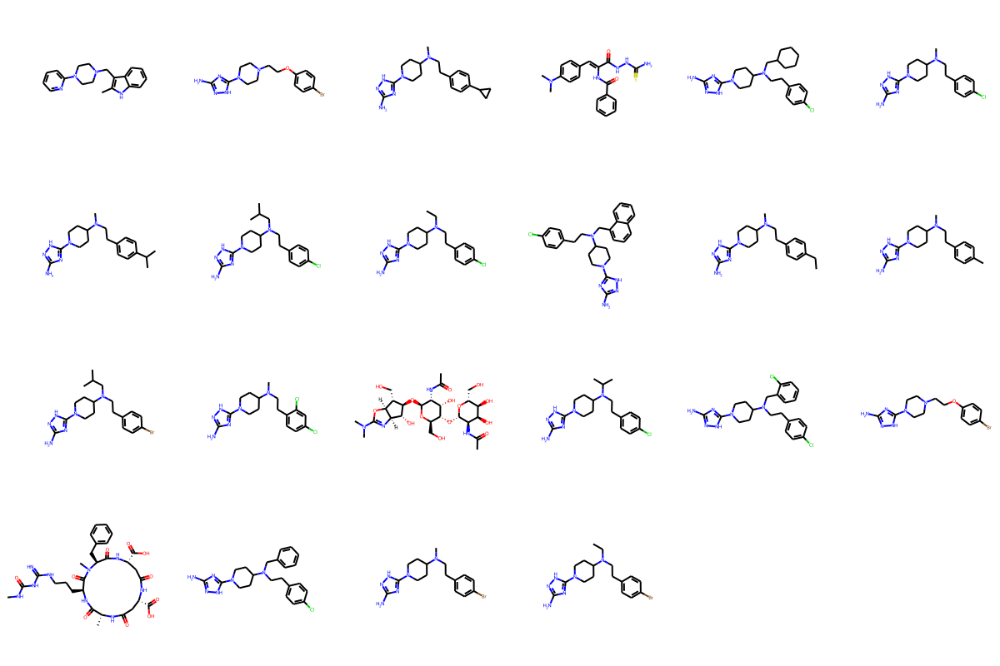

In [123]:
Draw.MolsToGridImage(smiles, molsPerRow=6)

In [124]:
#znajdywanie wspolnej podstruktury zwiazku, wynikiem jest format SMARTS
result = rdFMCS.FindMCS(smiles)
Chem.MolFromSmarts(result.smartsString)
result.smartsString

'[#6](:,-[#6]:,-[#6]:,-[#6]):,-[#6]:,-[#6]'

Uzycie funkcji MolFromSmarts wskazuje, ze jest to lancuch alifatyczny zlozny z atomow wegla. Jednak sam ciag SMARTS wyglada jak by byl to pierscien benzenowy.

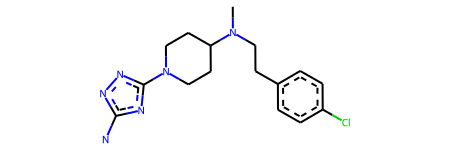

In [125]:
#wykorzystanie tego narzedzia na zestawie danych (lista 3 molekul) poddanych wizualnej selekcji
subList = [smiles[5],smiles[7],smiles[8]]
subResult = rdFMCS.FindMCS(subList)
Chem.MolFromSmarts(subResult.smartsString)

In [126]:
subResult.smartsString

'[#6]-[#7](-[#6]-[#6]-[#6]1:[#6]:[#6]:[#6](:[#6]:[#6]:1)-[#17])-[#6]1-[#6]-[#6]-[#7](-[#6]-[#6]-1)-[#6]1:[#7]:[#6](:[#7]:[#7]:1)-[#7]'

W momencie, gdy stworzylismy wyselekcjnowana liste trzech molekul, ciag SMILES odwzorowuje wpolna podstrukture.

In [127]:
#podobiestwo na przykladzie fingerprintsow
fps = [FingerprintMols.FingerprintMol(x) for x in smiles] 
DataStructs.FingerprintSimilarity(fps[0],fps[1]) #wyliczenie 

0.351278600269179

1 12 0.5
1 20 0.5
2 4 0.81
2 5 0.87
2 6 0.96
2 7 0.84
2 8 0.87
2 9 0.71
2 10 0.93
2 11 0.93
2 12 0.84
2 13 0.81
2 15 0.86
2 16 0.73
2 19 0.78
2 20 0.87
2 21 0.86
4 5 0.9
4 6 0.83
4 7 0.95
4 8 0.91
4 9 0.76
4 10 0.84
4 11 0.84
4 12 0.86
4 13 0.84
4 15 0.9
4 16 0.77
4 19 0.81
4 20 0.82
4 21 0.82
5 6 0.91
5 7 0.95
5 8 0.99
5 9 0.78
5 10 0.92
5 11 0.92
5 12 0.85
5 13 0.91
5 15 0.98
5 16 0.8
5 19 0.86
5 20 0.89
5 21 0.88
6 7 0.87
6 8 0.9
6 9 0.72
6 10 0.97
6 11 0.97
6 12 0.87
6 13 0.83
6 15 0.89
6 16 0.74
6 19 0.79
6 20 0.91
6 21 0.9
7 8 0.96
7 9 0.78
7 10 0.88
7 11 0.88
7 12 0.9
7 13 0.87
7 15 0.95
7 16 0.79
7 19 0.84
7 20 0.85
7 21 0.86
8 9 0.78
8 10 0.92
8 11 0.92
8 12 0.86
8 13 0.9
8 15 0.98
8 16 0.8
8 19 0.86
8 20 0.88
8 21 0.89
9 10 0.72
9 11 0.72
9 12 0.71
9 13 0.76
9 15 0.78
9 16 0.84
9 19 0.91
9 20 0.71
9 21 0.71
10 12 0.89
10 13 0.84
10 15 0.91
10 16 0.74
10 19 0.8
10 20 0.93
10 21 0.93
11 12 0.89
11 13 0.84
11 15 0.91
11 16 0.74
11 19 0.8
11 20 0.93
11 21 0.93
12 13 0.78
12 15 0.

/home/kd/anaconda3/lib/python3.7/site-packages/rdkit/Chem/Draw/IPythonConsole.py:192: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  % (maxMols))


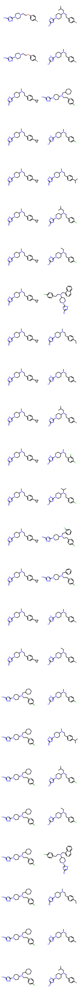

In [128]:
list_of_pairs = [] 
list_of_pairs_nodoubling = []
for i in range(len(fps)):
    for j in range(len(fps)):
        z = round(DataStructs.FingerprintSimilarity(fps[i],fps[j]),2)
        if z >= 0.5 and z < 1 and [i,j] not in list_of_pairs and [j,i] not in list_of_pairs:
            list_of_pairs.append([i,j])
            list_of_pairs_nodoubling.append(i)
            list_of_pairs_nodoubling.append(j)
            print(i, j, z)

Draw.MolsToGridImage([smiles[idx] for idx in list_of_pairs_nodoubling], molsPerRow=2)

In [129]:
print(f'W przypadku Tc naleziono: {len(list_of_pairs)} podobieństw binarnych')

W przypadku Tc naleziono: 123 podobieństw binarnych


1 12 0.66
1 20 0.66
1 21 0.66
2 4 0.89
2 5 0.93
2 6 0.98
2 7 0.91
2 8 0.93
2 9 0.83
2 10 0.96
2 11 0.96
2 12 0.91
2 13 0.89
2 15 0.93
2 16 0.84
2 19 0.87
2 20 0.93
2 21 0.93
4 5 0.95
4 6 0.91
4 7 0.97
4 8 0.95
4 9 0.86
4 10 0.91
4 11 0.91
4 12 0.93
4 13 0.91
4 15 0.95
4 16 0.87
4 19 0.9
4 20 0.9
4 21 0.9
5 6 0.95
5 7 0.98
5 9 0.88
5 10 0.96
5 11 0.96
5 12 0.92
5 13 0.95
5 15 0.99
5 16 0.89
5 19 0.92
5 20 0.94
5 21 0.94
6 7 0.93
6 8 0.95
6 9 0.84
6 10 0.98
6 11 0.98
6 12 0.93
6 13 0.91
6 15 0.94
6 16 0.85
6 19 0.88
6 20 0.95
6 21 0.95
7 8 0.98
7 9 0.88
7 10 0.94
7 11 0.94
7 12 0.95
7 13 0.93
7 15 0.98
7 16 0.88
7 19 0.92
7 20 0.92
7 21 0.92
8 9 0.88
8 10 0.96
8 11 0.96
8 12 0.92
8 13 0.95
8 15 0.99
8 16 0.89
8 19 0.93
8 20 0.94
8 21 0.94
9 10 0.84
9 11 0.84
9 12 0.83
9 13 0.86
9 15 0.88
9 16 0.91
9 19 0.95
9 20 0.83
9 21 0.83
10 12 0.94
10 13 0.91
10 15 0.95
10 16 0.85
10 19 0.89
10 20 0.97
10 21 0.96
11 12 0.94
11 13 0.91
11 15 0.95
11 16 0.85
11 19 0.89
11 20 0.97
11 21 0.96
12 13 0.8

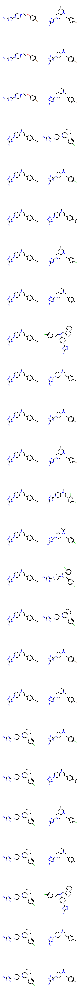

In [130]:
list_of_pairs_ds = [] 
list_of_pairs_nodoubling = []
for i in range(len(fps)):
    for j in range(len(fps)):
        z = round(DataStructs.FingerprintSimilarity(fps[i],fps[j], metric=DataStructs.DiceSimilarity),2)
        if z > 0.65 and z < 1 and [i,j] not in list_of_pairs_ds and [j,i] not in list_of_pairs_ds:
            list_of_pairs_ds.append([i,j])
            list_of_pairs_nodoubling.append(i)
            list_of_pairs_nodoubling.append(j)
            print(i, j, z)

Draw.MolsToGridImage([smiles[idx] for idx in list_of_pairs_nodoubling], molsPerRow=2)

In [131]:
print(f'W przypadku Dc naleziono: {len(list_of_pairs_ds)} podobieństw binarnych')

W przypadku Dc naleziono: 123 podobieństw binarnych


In [132]:
counter = 0
for pair in list_of_pairs:
    for pair_ds in list_of_pairs_ds:
        if pair == pair_ds:
            counter += 1
print("Tc i Dc dają bardzo podobne listy podobnych par, prawie identyczne. \n \
W przypadku zarówno Tc jak i Dc dostaliśmy 123 pary związków, z czego 121 par się pokrywa.")
    

Tc i Dc dają bardzo podobne listy podobnych par, prawie identyczne. 
 W przypadku zarówno Tc jak i Dc dostaliśmy 123 pary związków, z czego 121 par się pokrywa.


In [133]:
from rdkit.Chem import AllChem
fpc = [AllChem.GetMorganFingerprint(x , 2) for x in smiles] # 2 to głębokość połączeń.

list_of_pairs_ds = [] 
list_of_pairs_nodoubling = []
list_of_verysimilar_pairs = []
for i in range(len(fpc)):
    for j in range(len(fpc)):
        z = round(DataStructs.DiceSimilarity(fpc[i],fpc[j]), 2)
        if z > 0.5 and z < 1 and [i,j] not in list_of_pairs_ds and [j,i] not in list_of_pairs_ds:
            list_of_pairs_ds.append([i,j])
            list_of_pairs_nodoubling.append(i)
            list_of_pairs_nodoubling.append(j)
            if z>0.91:
                list_of_verysimilar_pairs.append(i)
                list_of_verysimilar_pairs.append(j)
            print(i, j, z)

1 2 0.56
1 4 0.51
1 5 0.58
1 6 0.56
1 7 0.55
1 8 0.57
1 10 0.57
1 11 0.58
1 12 0.64
1 13 0.53
1 15 0.56
1 19 0.51
1 20 0.68
1 21 0.66
2 4 0.75
2 5 0.87
2 6 0.84
2 7 0.75
2 8 0.78
2 9 0.64
2 10 0.85
2 11 0.87
2 12 0.75
2 13 0.74
2 15 0.77
2 16 0.68
2 17 0.56
2 19 0.69
2 20 0.87
2 21 0.78
4 5 0.79
4 6 0.69
4 7 0.81
4 8 0.83
4 9 0.7
4 10 0.71
4 11 0.72
4 12 0.73
4 13 0.65
4 15 0.77
4 16 0.74
4 17 0.51
4 19 0.75
4 20 0.72
4 21 0.75
5 6 0.88
5 7 0.87
5 8 0.9
5 9 0.74
5 10 0.89
5 11 0.91
5 12 0.79
5 13 0.84
5 15 0.89
5 16 0.78
5 17 0.58
5 19 0.79
5 20 0.91
5 21 0.81
6 7 0.81
6 8 0.79
6 9 0.64
6 10 0.87
6 11 0.89
6 12 0.81
6 13 0.75
6 15 0.83
6 16 0.68
6 17 0.56
6 19 0.69
6 20 0.88
6 21 0.79
7 8 0.91
7 9 0.75
7 10 0.8
7 11 0.8
7 12 0.92
7 13 0.72
7 15 0.9
7 16 0.8
7 17 0.55
7 19 0.81
7 20 0.79
7 21 0.83
8 9 0.77
8 10 0.83
8 11 0.81
8 12 0.83
8 13 0.74
8 15 0.87
8 16 0.82
8 17 0.57
8 19 0.83
8 20 0.81
8 21 0.91
9 10 0.66
9 11 0.66
9 12 0.68
9 13 0.63
9 15 0.71
9 16 0.88
9 19 0.87
9 20 0.66
9 2

In [134]:
print(f"Liczba par w przypadku ECFP jest rowna: 148, czyli o 25 więcej niż wcześniej")

Liczba par w przypadku ECFP jest rowna: 148, czyli o 25 więcej niż wcześniej


Dla najbardziej podobnej pary: 7 i 12
0.14640522875816997


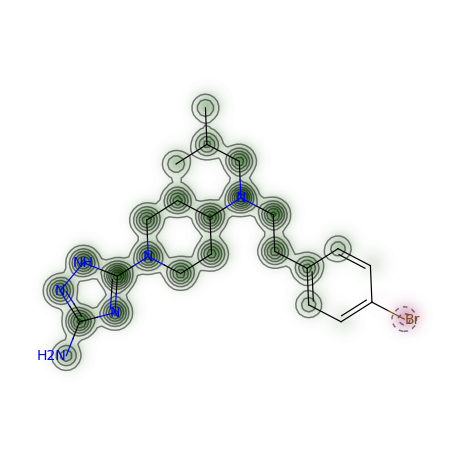

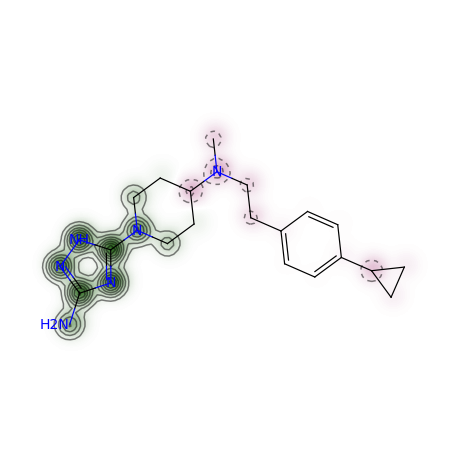

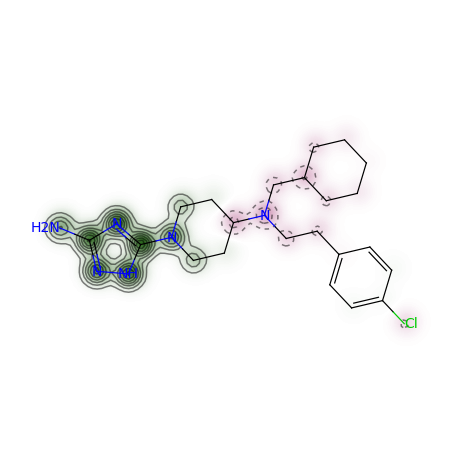

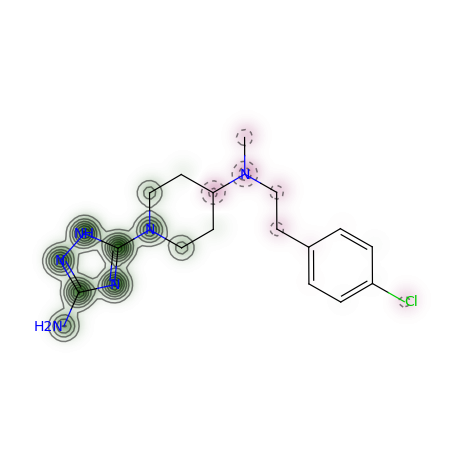

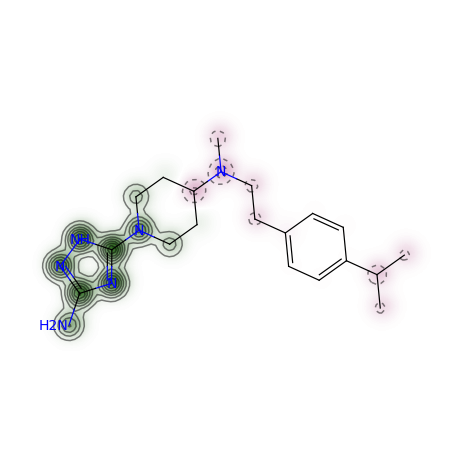

...

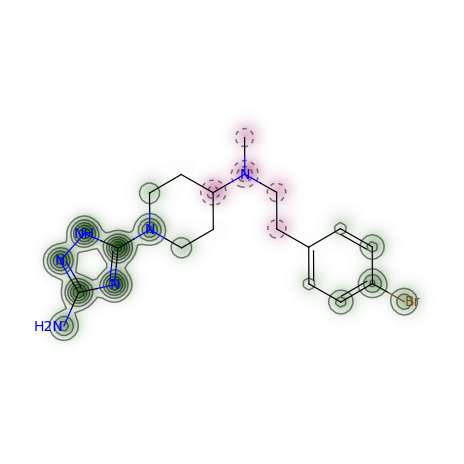

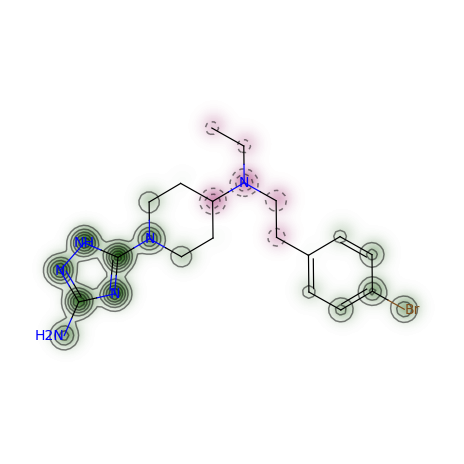

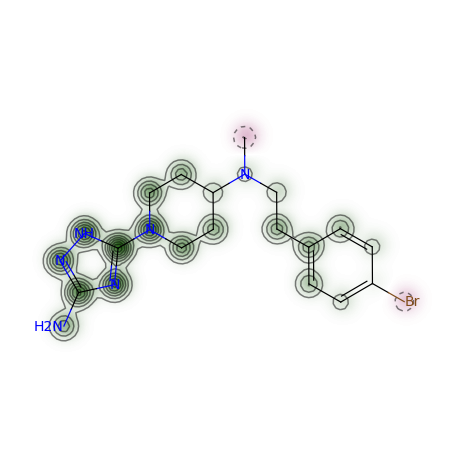

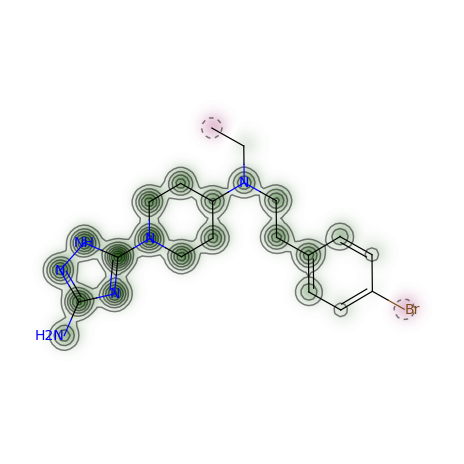

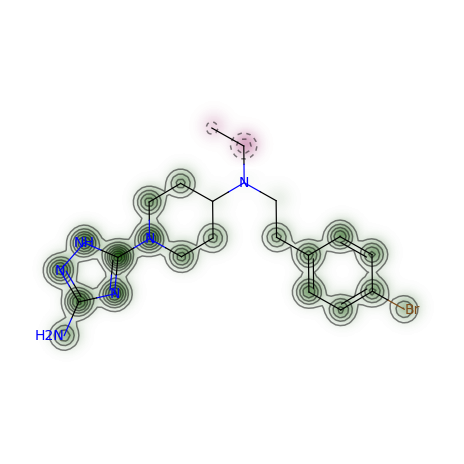

In [135]:
from rdkit.Chem.Draw import SimilarityMaps
print("Dla najbardziej podobnej pary: 7 i 12")
fig, maxweight = SimilarityMaps.GetSimilarityMapForFingerprint(smiles[7],smiles[12], SimilarityMaps.GetMorganFingerprint)
print(maxweight)
for idx1, idx2 in list_of_pairs_ds:
    fig, maxweight = SimilarityMaps.GetSimilarityMapForFingerprint(smiles[idx1],smiles[idx2], SimilarityMaps.GetMorganFingerprint)
    fig

In [136]:
print("Wyniki wydają się zgodne z moją intuicją. Mapy podobieństwa cząsteczek, a konkretnie fragmenty molekuły \n \
      bedące podobne u obu cząsteczek są tym większe im większe wyliczone powyżej podobieństwo cząsteczek - im \n \
      większa część mapy podobieństwa jest pokolorowana na zielono, tym większe podobieństwo cząsteczek.")

Wyniki wydają się zgodne z moją intuicją. Mapy podobieństwa cząsteczek, a konkretnie fragmenty molekuły 
       bedące podobne u obu cząsteczek są tym większe im większe wyliczone powyżej podobieństwo cząsteczek - im 
       większa część mapy podobieństwa jest pokolorowana na zielono, tym większe podobieństwo cząsteczek.
